In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

In [ ]:
!pip install kaggle
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d smartcitylabncai/pakistaniweeddataset

In [ ]:
import os
from google.colab import files

# Check if 'train' directory already exists
if not os.path.exists('train'):
    # Define the path to the downloaded ZIP file
    zip_file_path = '/content/yolov5/pakistaniweeddataset.zip'

    # Check if the dataset ZIP file exists
    if os.path.exists(zip_file_path):
        # Unzip the dataset
        !unzip "$zip_file_path" -d /content/
        print("Dataset unzipped successfully.")

        # Remove the ZIP file to free up disk space
        os.remove(zip_file_path)
    else:
        print("The dataset ZIP file does not exist in the specified path.")
else:
    print("The 'train' directory already exists. No further action is needed.")


In [ ]:
%cd /content/yolov5

In [ ]:
%cat /content/yolov5/data/custom.yaml

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5n.yaml

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 5 --data /content/yolov5/data/custom.yaml --cfg /content/yolov5/models/yolov5n.yaml --weights /content/yolov5/runs/train/yolov5s_results2/weights/best.pt --name yolov5s_results  --cache

# Evaluate Custom YOLOv5 Detector Performance

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 11053), started 0:44:27 ago. (Use '!kill 11053' to kill it.)

<IPython.core.display.Javascript object>

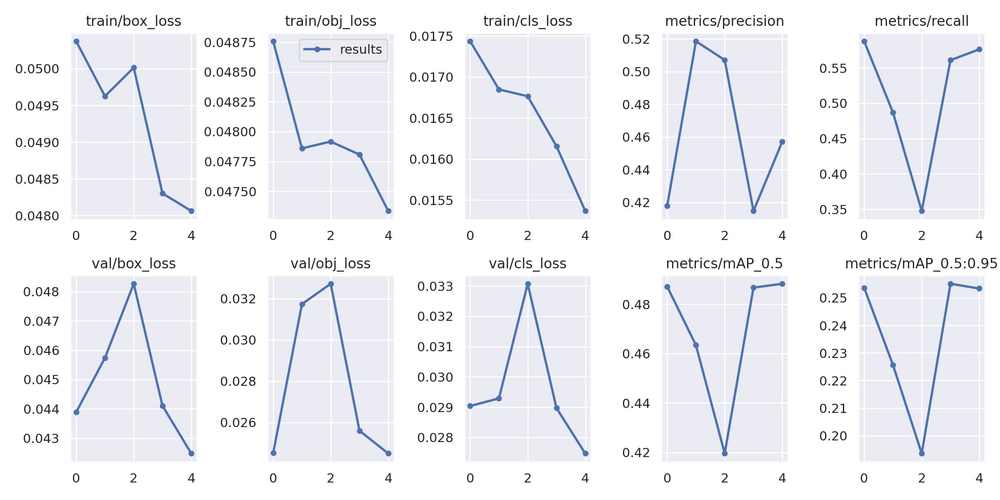

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results3/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


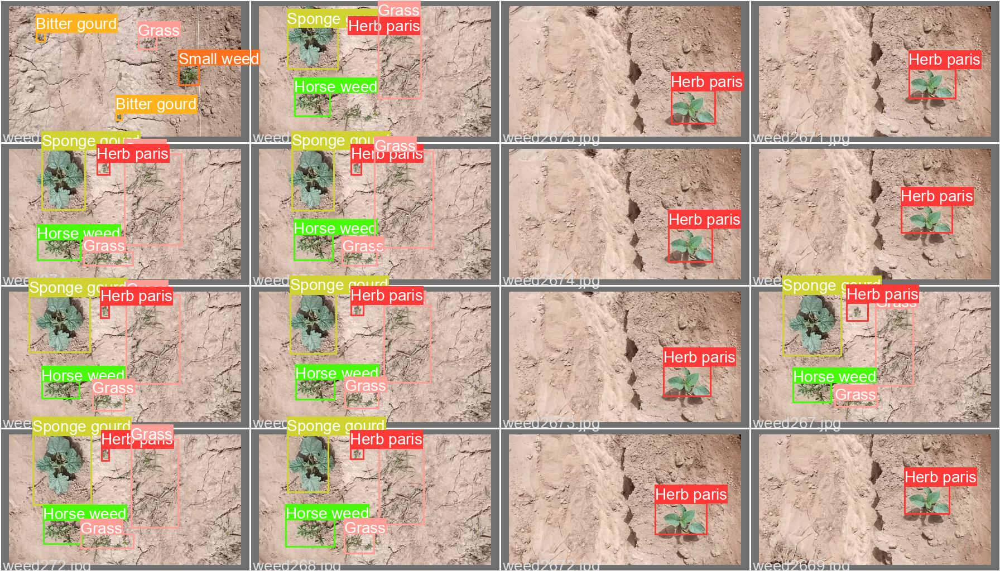

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results3/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


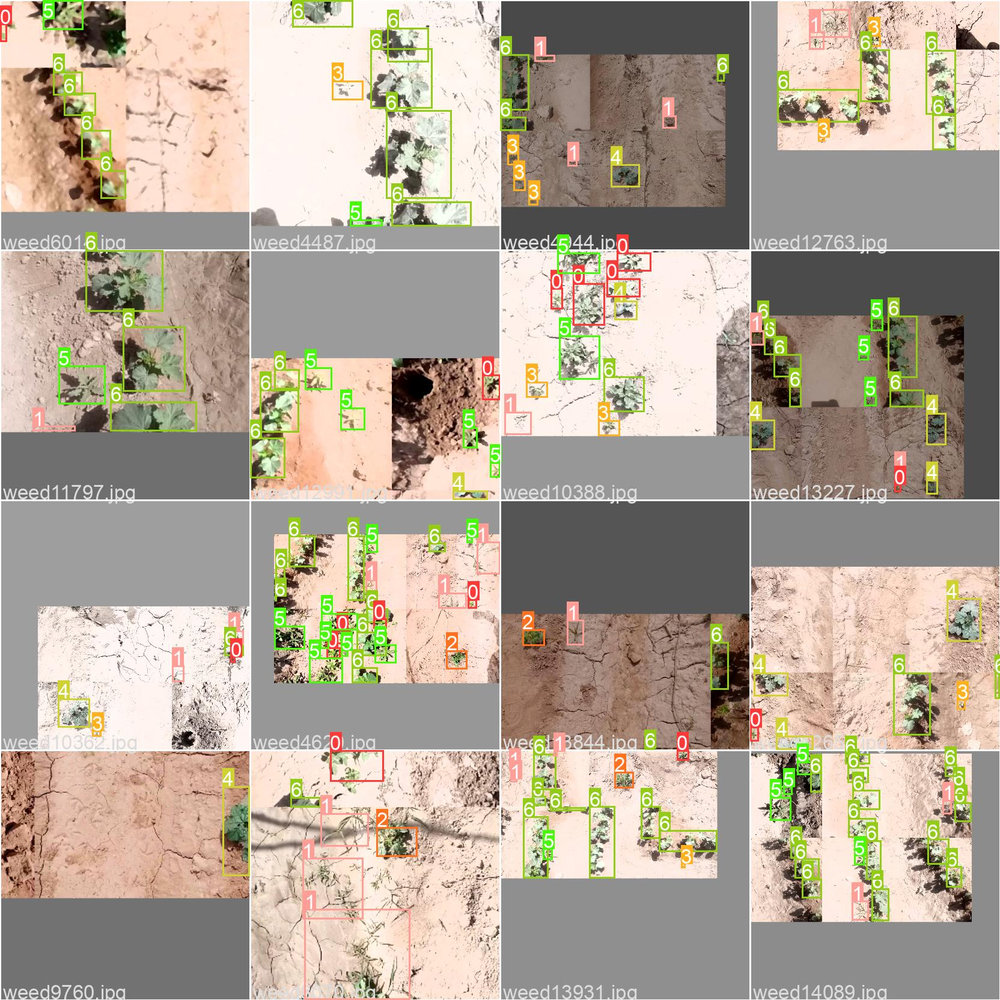

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results3/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images`


In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results3/weights/best.pt --img 416 --conf 0.4 --source ../test/images

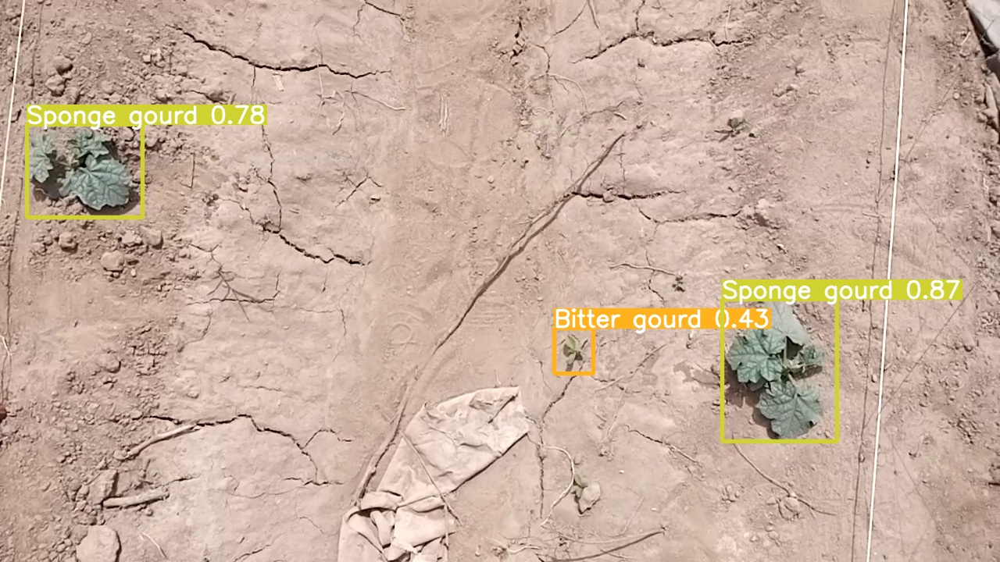

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/weed1323.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results2/weights/best.pt  /content/gdrive/MyDrive/NANO_OPT/

In [ ]:
!python export.py --weights runs/train/yolov5s_results3/weights/best.pt --include tflite --img-size 416 --batch-size 1 --data /content/yolov5/data/custom.yaml


In [ ]:
!pip install -U flatbuffers

In [ ]:
!python val.py --weights runs/train/yolov5s_results2/weights/best.pt --data /content/yolov5/data/custom.yaml --img 640 --half